####Base de dados de cyberbullying do twitter

https://www.kaggle.com/datasets/andrewmvd/cyberbullying-classification/data

o objetivo da base é realizar uma análise das palavras mais utilizadas para realizar bullying na internet e um modelo que consiga prever com acurácia adequada (por volta de 70%) a identificar tweets potencialmente ofensivos

In [ ]:
import pandas as pd
import seaborn as sns
import nltk
import matplotlib.pyplot as plt
import numpy as np

from sklearn import metrics
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

#seed
seed = 0
np.random.seed(seed)

###Base de dados e tratamento

primeiro a extração da base de dados, informações e tratamentos iniciais

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Pessoal/IBM - Escola de IA/cyberbullying_tweets.csv')
df.head()

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying


In [ ]:
df.shape

(47692, 2)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


In [ ]:
df['cyberbullying_type'].value_counts()

religion               7998
age                    7992
gender                 7973
ethnicity              7961
not_cyberbullying      7945
other_cyberbullying    7823
Name: cyberbullying_type, dtype: int64

In [ ]:
df['cyberbullying_type'] = df['cyberbullying_type'].map({'not_cyberbullying':'normal','other_cyberbullying':'other types'}).fillna(df['cyberbullying_type'])

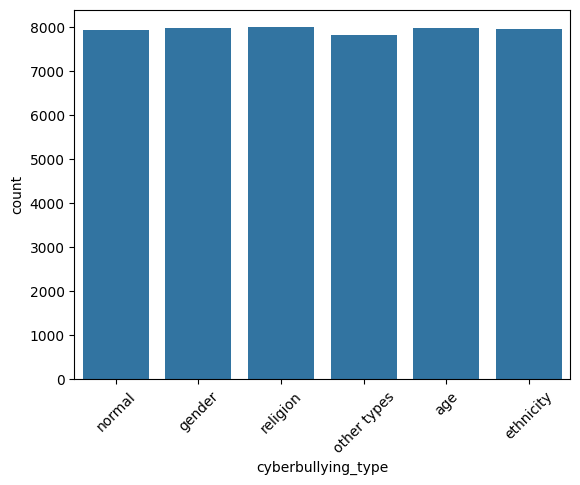

In [ ]:
ax = sns.countplot(data=df, x='cyberbullying_type')
ax.tick_params(axis='x', rotation=45)

o gráfico mostra que as variáveis são balanceadas

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
import re

special_char = lambda x: re.sub('[!,*)@:#%(&$_?.^-]', '', x) # remove caracteres especiais
alphanumeric = lambda x: re.sub('\w*\d\w*', ' ', x) # remove palavras alfanuméricas
contra_barra_erre =  lambda x: re.sub(r'[^ \w\.]', '', x).lower()

df['tweet_text'] = df['tweet_text'].map(alphanumeric).map(special_char).map(contra_barra_erre)

retirando alguns caracteres especiais por se tratar de uma rede social e que palavras iguais podem ser escritas de formas diferentes usando números no lugar de letras
além disso, todas as palavras foram postas como minúsculas para uniformizar e evitar que palavras iguais escritas com maiúscula e minúscula sejam contadas de formas diferentes

In [ ]:
df['tweet_text']

0        in other words katandandre your food was crapi...
1        why is aussietv so white mkr theblock imaceleb...
2        xochitlsuckkks a classy whore or more red velv...
3        jasongio meh p  thanks for the heads up but no...
4        rudhoeenglish this is an isis account pretendi...
                               ...                        
47687    black ppl arent expected to do anything depend...
47688    turner did not withhold his disappointment tur...
47689    i swear to god this dumb nigger bitch i have g...
47690    yea fuck you rt therealexel if youre a nigger ...
47691    bro u gotta chill rt chillshrammy dog fuck kp ...
Name: tweet_text, Length: 47692, dtype: object

In [ ]:
X = df.loc[:,df.columns == 'tweet_text']  # Entrada
y = df.cyberbullying_type   # Saída
X_treino, X_teste, y_treino, y_teste = train_test_split(X, y, test_size=0.2,
                                                        stratify=y)

base separada em treino e teste estratificando por y para manter o balanceamento

In [ ]:
print(y.count())
print(y.value_counts())

47692
religion       7998
age            7992
gender         7973
ethnicity      7961
normal         7945
other types    7823
Name: cyberbullying_type, dtype: int64


In [ ]:
# Verificar proporção para teste para confirmar amostragem estratificada
print(0.2*y.value_counts()[0])
print(0.2*y.value_counts()[1])
print(0.2*y.value_counts()[2])
print(0.2*y.value_counts()[3])
print(0.2*y.value_counts()[4])
print(0.2*y.value_counts()[5])

1599.6000000000001
1598.4
1594.6000000000001
1592.2
1589.0
1564.6000000000001


In [ ]:
#amostragem estratificada com relação aos valores esperados
y_testvalue_counts()e.

religion       1600
age            1598
gender         1595
ethnicity      1592
normal         1589
other types    1565
Name: cyberbullying_type, dtype: int64

###Treino e teste do modelo

In [ ]:
#importando a lista de stopwords
nltk.download('stopwords')
stop_words = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
#método BoW
vect_bow = CountVectorizer(stop_words=stop_words)
#método Tfidf
vect_tfidf = TfidfVectorizer(stop_words=stop_words)

vamos utilizar os dois métodos para comparar e ver se algum é mais recomendado para analisar o problema

In [ ]:
X_treino_bow = vect_bow.fit_transform(X_treino['tweet_text'])

In [ ]:
X_treino_bow.shape

(38153, 51684)

In [ ]:
X_treino_tfidf = vect_tfidf.fit_transform(X_treino['tweet_text'])

In [ ]:
X_treino_tfidf.shape

(38153, 51684)

In [ ]:
y_treino.value_counts()

religion       6398
age            6394
gender         6378
ethnicity      6369
normal         6356
other types    6258
Name: cyberbullying_type, dtype: int64

In [ ]:
# Obtendo o vocabulário (lista de palavras) do vetorizador
vocabulario_bow = vect_bow.get_feature_names_out()

# Imprimindo a matriz de contagem e o vocabulário
print('Matriz de contagem:')
print(X_treino_bow.toarray())
print('Vocabulário:')
print(vocabulario_bow)

Matriz de contagem:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Vocabulário:
['aa' 'aaa' 'aaaa' ... '𝕧𝕖𝕣𝕠𝕟𝕚𝕔𝕒' '𝕨𝕠𝕦𝕝𝕕' '𝕫𝕠𝕖𝕪']


In [ ]:
vocabulario_tfidf = vect_tfidf.get_feature_names_out()

print('Matriz de contagem:')
print(X_treino_tfidf.toarray())
print('Vocabulário:')
print(vocabulario_tfidf)

Matriz de contagem:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Vocabulário:
['aa' 'aaa' 'aaaa' ... '𝕧𝕖𝕣𝕠𝕟𝕚𝕔𝕒' '𝕨𝕠𝕦𝕝𝕕' '𝕫𝕠𝕖𝕪']


In [ ]:
#treinando o modelo e retirando o score dele

#primeiro com o método CountVector
from sklearn import svm
clf_bow = svm.SVC(kernel='rbf', probability=True).fit(X_treino_bow, y_treino)
clf_bow.score(X_treino_bow, y_treino)

0.9115141666448248

In [ ]:
#avaliando com cross validantion a média de scores
#não é necessário usar scoring como F1, porque a amostra é balanceada e os resultados entre F1 e acurácia serão parecidos

from sklearn.model_selection import cross_val_score
scores_bow = cross_val_score(clf_bow, X_treino_bow, y_treino, cv=3)
scores_bow

array([0.83134141, 0.82866803, 0.82605961])

In [ ]:
print("%0.4f accuracy with a standard deviation of %0.4f" % (scores_bow.mean(), scores_bow.std()))

0.8287 accuracy with a standard deviation of 0.0022


utilizando a base inteira para treinar o modelo por countvector tivemos uma acurácia de 91%. Ao separar em 3 bases de treino, obtivemos acurácia média de 82%

In [ ]:
#segundo com o método tfidf
clf_tfidf = svm.SVC(kernel='rbf', probability=True).fit(X_treino_tfidf, y_treino)
clf_tfidf.score(X_treino_tfidf, y_treino)

0.955311508924593

In [ ]:
scores_tfidf = cross_val_score(clf_tfidf, X_treino_tfidf, y_treino, cv=3)

In [ ]:
scores_tfidf

array([0.82096242, 0.82253499, 0.81913973])

In [ ]:
print("%0.4f accuracy with a standard deviation of %0.4f" % (scores_tfidf.mean(), scores_tfidf.std()))

0.8209 accuracy with a standard deviation of 0.0014


utilizando a base inteira para treinar o modelo por tfidf obtivemos acurácia de 95,5%. Ao separar a base de treino em 3, obtivemos acurácia média de 82%

In [ ]:
X_teste_bow = vect_bow.transform(X_teste['tweet_text'])
X_teste_tfidf = vect_tfidf.transform(X_teste['tweet_text'])

In [ ]:
X_teste.shape

(9539, 1)

In [ ]:
predictions_bow = clf_bow.predict(X_teste_bow)
predictions_bow

array(['religion', 'ethnicity', 'religion', ..., 'normal', 'religion',
       'gender'], dtype=object)

In [ ]:
predictions_tfidf = clf_tfidf.predict(X_teste_tfidf)
predictions_tfidf

array(['religion', 'ethnicity', 'religion', ..., 'normal', 'religion',
       'religion'], dtype=object)

In [ ]:
from sklearn.metrics import confusion_matrix

cm_bow = confusion_matrix(y_teste, predictions_bow)

In [ ]:
cm_tfidf = confusion_matrix(y_teste, predictions_tfidf)

In [ ]:
y_teste.value_counts()

religion       1600
age            1598
gender         1595
ethnicity      1592
normal         1589
other types    1565
Name: cyberbullying_type, dtype: int64

predições realizadas e matrizes de confusão montadas

###Matriz de confusão e gráficos de previsão e acerto

[Text(0, 0.5, 'age'),
 Text(0, 1.5, 'ethnicity'),
 Text(0, 2.5, 'gender'),
 Text(0, 3.5, 'normal'),
 Text(0, 4.5, 'other types'),
 Text(0, 5.5, 'religion')]

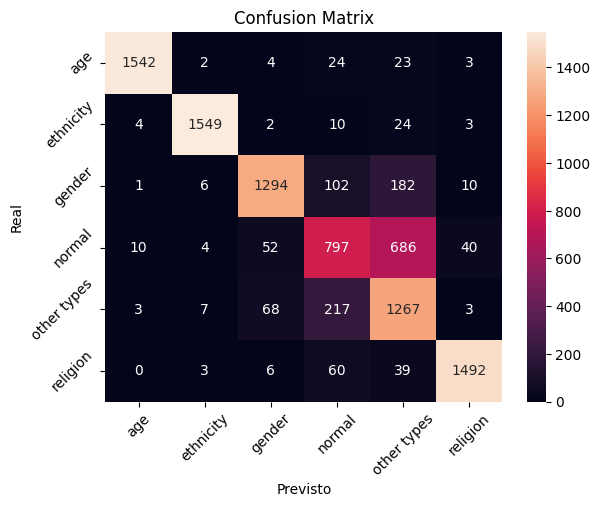

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

ax= plt.subplot()
sns.heatmap(cm_bow, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Previsto');ax.set_ylabel('Real');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['age', 'ethnicity', 'gender', 'normal', 'other types', 'religion'], rotation=45); ax.yaxis.set_ticklabels(['age', 'ethnicity', 'gender', 'normal', 'other types', 'religion'], rotation=45)

[Text(0, 0.5, 'age'),
 Text(0, 1.5, 'ethnicity'),
 Text(0, 2.5, 'gender'),
 Text(0, 3.5, 'normal'),
 Text(0, 4.5, 'other types'),
 Text(0, 5.5, 'religion')]

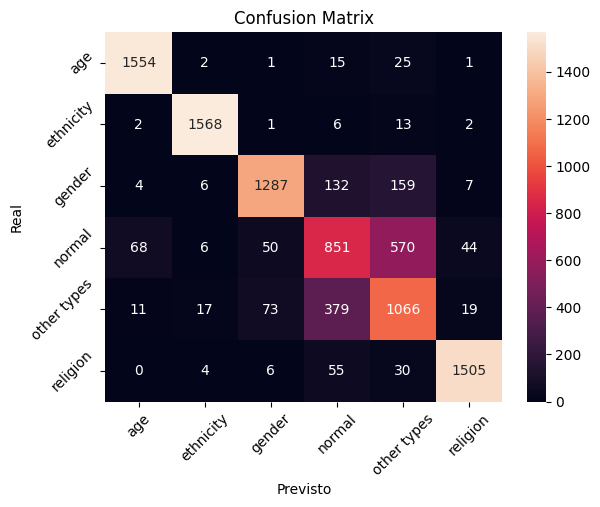

In [ ]:
ax= plt.subplot()
sns.heatmap(cm_tfidf, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Previsto');ax.set_ylabel('Real');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['age', 'ethnicity', 'gender', 'normal', 'other types', 'religion'], rotation=45); ax.yaxis.set_ticklabels(['age', 'ethnicity', 'gender', 'normal', 'other types', 'religion'], rotation=45)

de acordo com os gráficos acima das matrizes de confusão, vemos que os resultados, ainda que parecidos, tem mais acertos pelo método de tfidf do que pelo método de countvector.
além disso, o pior tipo de erro seria ter um tweet que é bullying ser previsto como normal, portanto é preferível que seja classificado errado como bullying do que ser classificado errado comom normal. O segundo método parece ter menos esse tipo de erro, por isso seria mais adequado, contudo nesse método o único tipo de bullying classificado pior do que o primeiro modelo é o de other types, que foram classificados como normal.

###Wordcloud

vamos realizar uma wordcloud geral e depois estratificar pelos tipos de bullying para identificar quais as palavras mais utilizadas para cada tipo de bullying

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [ ]:
df.tweet_text

0        in other words katandandre your food was crapi...
1        why is aussietv so white mkr theblock imaceleb...
2        xochitlsuckkks a classy whore or more red velv...
3        jasongio meh p  thanks for the heads up but no...
4        rudhoeenglish this is an isis account pretendi...
                               ...                        
47687    black ppl arent expected to do anything depend...
47688    turner did not withhold his disappointment tur...
47689    i swear to god this dumb nigger bitch i have g...
47690    yea fuck you rt therealexel if youre a nigger ...
47691    bro u gotta chill rt chillshrammy dog fuck kp ...
Name: tweet_text, Length: 47692, dtype: object

In [ ]:
text = ' '.join([text for text in df.tweet_text])
text

'in other words katandandre your food was crapilicious mkr why is aussietv so white mkr theblock imacelebrityau today sunrise   neighbours wonderlandten etc xochitlsuckkks a classy whore or more red velvet cupcakes jasongio meh p  thanks for the heads up but not too concerned about another angry dude on twitter rudhoeenglish this is an isis account pretending to be a kurdish account  like islam it is all lies   quickieleaks yes the test of god is that good or bad or indifferent or weird or whatever it all proves gods existence itu sekolah ya bukan tempat bully ga jauh kaya neraka karma i hope it bites kat on the butt she is just nasty mkr stockputout everything but mostly my priest rebecca black drops out of school due to bullying jordisdead httptco  the bully flushes on kd httptwitvidcom  ughhhh mkr rt kurdsnews turkish state has killed   children in last   years httptco   news  googleçeviricitopluluğukürtçeyidee love that the best response to the hotcakes they managed to film was a n

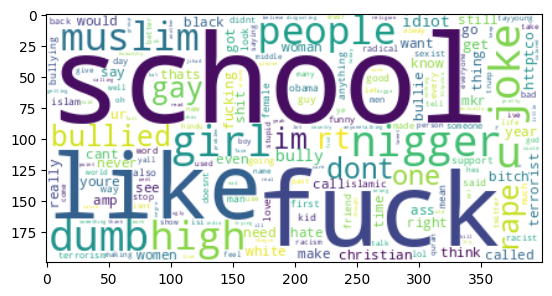

In [ ]:
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords=stop_words).generate(text)
plt.imshow(word_cloud, interpolation='bilinear')

In [ ]:
df_religion = df[df['cyberbullying_type']=='religion']

In [ ]:
text_religion = ' '.join([text for text in df_religion.tweet_text])
text_religion

'sudeep did she invite him though no right why are you getting worded up youre okay with parvesh verma cause he speaks against muslims but against an idiot like imam because he called for chakka jam discerningmumin islam has never been a resistance to oppression it has always been source of oppression to both believers and non believer boy your comment about journalists wanting to keep churches closed is beneath you as a christian woman and human being your bosses filth is brushing off on you not at all unbiased and a down right lie shame on you shashitharoor incindia hindus were and are getting killed by muslims terriorists in kashmir congress mukt bharat will certainly happen if congressmen like you dont change their idealogies and keep sounding like idiots you actually dont need enemies white supremicists how many do you know there a few idiots in all races where is antisemitism coming from dems blm antifa muslims you wont appease them by throwing white supremacy they hate you amp w

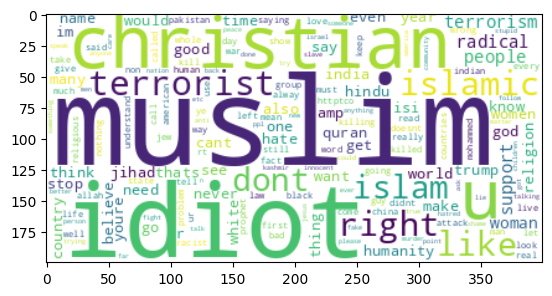

In [ ]:
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords=stop_words).generate(text_religion)
plt.imshow(word_cloud, interpolation='bilinear')

In [ ]:
df_age = df[df['cyberbullying_type']=='age']

In [ ]:
text_age = ' '.join([text for text in df_age.tweet_text])
text_age

'here at home neighbors pick on my family and i mind you my son is autistic it feels like high school they call us names attack us for no reason and bully us all the time cant step on my front porch without them doing something to us being bullied at school highachieving boys use further strategies to maintain masculinity for example becoming bullies themselves disrupting the lessons or devaluing girls achievements httpswwwbipartisanalliancecom  beingbulliedatschoolhighachievinghtmlspreftw there was a girl in my class in   grade who was a little autistic and her parents thought itd be better to send her to a public school she didnt fit in with the class and was lowkey bullied it was actually high key but the teacher downplayed it and did nothing hes probably a white gay kid from some suburb we dont want him to shoot up his schoolso no one bully him you are pushed ti resorting treating thr bullies is you percent then from being pressured most school sitters evidence severe bullying trea

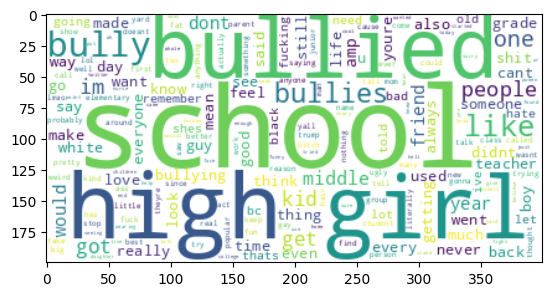

In [ ]:
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords=stop_words).generate(text_age)
plt.imshow(word_cloud, interpolation='bilinear')

In [ ]:
df_gender = df[df['cyberbullying_type']=='gender']

In [ ]:
text_gender = ' '.join([text for text in df_gender.tweet_text])
text_gender

'rape is realzvasiyana nema jokes about being drunk or being gay or being lesbianrape is not ones choice or wishthtz where the sensitivity is coming from you never saw any celebrity say anything like this for obama b maher incest rape joke s colbert gay joke k griffin beheading joke manhattaknight i mean hes gay but he uses gendered slurs and makes rape jokes rt   aliciabernardez alexaim mecaesmal  feminazi rape is rape and the fact that i read one post about a guy getting raped and the comments are calling him gay and he should be happy stfu and i really hope no one takes this as a joke tf you own no ones body you have no rights to do whatever you want to someone else coiny also its hard to take a company seriously re harassment when the game has rape jokes amp gay jokes and treats women the way it does idgaf if you are gay lesbian bisexual or whatever the fuck you are you dont fuck make a rape joke and think its fucken ok germanprofessor gives meaning to term feminazidoesnt hire indi

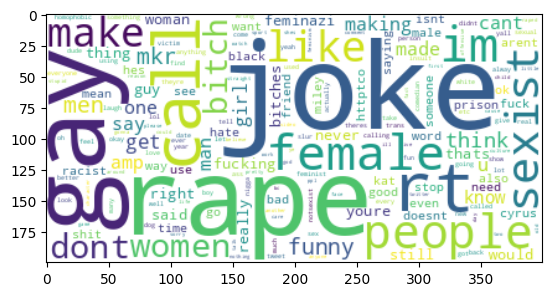

In [ ]:
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords=stop_words).generate(text_gender)
plt.imshow(word_cloud, interpolation='bilinear')

In [ ]:
df_ethnicity = df[df['cyberbullying_type']=='ethnicity']

In [ ]:
text_ethnicity = ' '.join([text for text in df_ethnicity.tweet_text])
text_ethnicity

'hey dumb fuck celebs stop doing something for people for publicity on facebook wtf happen to life u niggers are cowards fuck u bitch rt tayyoung fuck obama dumb ass nigger joebiden no joe you are the racist they have so many video and audio clips of the racist shit you have spewed in your past how can anyone see you as anything but a racist you hate black people just admit it and you loves the women to touch just look at your own stuff when your truck looks dumb as fuck out trying to make it look worse you aint country quit tryin nigger that nigger food in the cafe today was disgusting muthafuckas still ego trippingfool fuck your damn ego and live life to the fullest lol at these dumb ass niggers with the bullshit imadeyoumoan dont play dumb i should fuck yo little white ass up you nigger   aw i will only say it once if you do not fear have the suspicion of being called a nigger nigga or negro at any point in your life you cannot use the n word period i am talking about non black peop

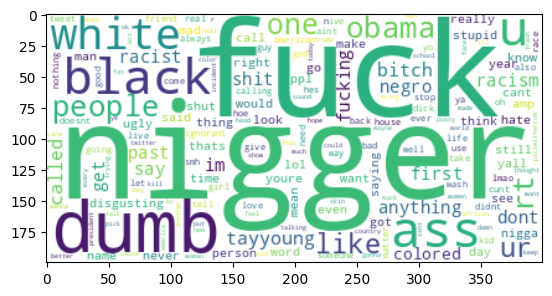

In [ ]:
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords=stop_words).generate(text_ethnicity)
plt.imshow(word_cloud, interpolation='bilinear')

In [ ]:
df_others = df[df['cyberbullying_type']=='other types']

In [ ]:
text_others = ' '.join([text for text in df_others.tweet_text])
text_others

'ikralla fyi it looks like i was caught by it im not a botter so i need to just switch to an organizationbased github but i dont want to pay  month because im cheap  rmaed my monoprice shoddy power bricks on those getting a refund and picking up another asus   its cheaper anyways murphyslaw httpstco    ive got the code to interpret amp analyze but the weights themselves are going to take a lot of fiddling krainboltgreene didnt mention your name i call out behavior not people lt  rt exokmv i swear people are so fucking ignorant and annoying yeah ive got a bit of a rageboner mentally speaking rt laralyn uh wow httpstcocdonlaapvr the morning after hung over struggling to remember how that pile of oreilly books ended up in your bed what did i code last night mkr heading into   with another instant restaurant round rt buzzfeeduk when you accidentally open your front camera httptco  that begacheese ad is so old im wondering if the old digger is still alive  mkr  lol getting oapis github set 

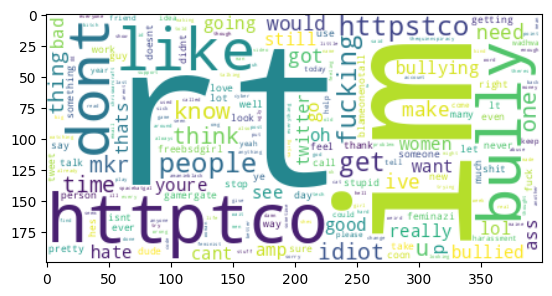

In [ ]:
word_cloud = WordCloud(collocations = False, background_color = 'white', stopwords=stop_words).generate(text_others)
plt.imshow(word_cloud, interpolation='bilinear')

com base nas wordclouds acima, vemos que a maioria é condizente com exceção do other types de bullying, onde as palavras mais repetidas são rt (retweets), inícios de endereços de web, palavras comuns da língua inglesa (i'm, get, you're, etc), portanto os tweets classificados como other types de bullying parecem conter muitas palavras de um tweet normal e talvez isso explique o pior índice de acerto do método tfidf no gráfico da matriz de confusão.
dessa forma, ainda que esse erro seja pior pelo método tfidf, ele é mais compreensível e parece menos problemático do que outros tipos de erro de classificação e podemos concluir que o método tfidf seria o mais adequado para ajudar o modelo a classificar tweets potencialmente ofensivos